# Testing pygwalker

In [64]:
# Import Libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress, ttest_ind
import scipy.stats as stats
from scipy import stats
import pygwalker as pyg
from pygwalker import GlobalVarManager
import sys
import requests


### Installation

In [65]:
# # Ensure the correct conda enviornment is selected
# !conda activate dev

# # Ensure Conda is up to date
# !conda update --all

# # Install pygwalker
# !conda install -c conda-forge pygwalker

# #This code was used to ensure it would display properly in Jupyter Lab
# !pip install --upgrade jupyterlab ipywidgets
# !pip install --upgrade gw-dsl-parser==0.1.8a0 duckdb==0.9.2 segment-analytics-python==2.2.3
# !jupyter labextension install @jupyter-widgets/jupyterlab-manager

In [66]:
# Load CSVs
menu_df = pd.read_csv('Data/fastfood.csv')

chains_df = pd.read_csv('Data/chains.csv')

In [67]:
menu_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515 entries, 0 to 514
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   restaurant   515 non-null    object 
 1   item         515 non-null    object 
 2   calories     515 non-null    int64  
 3   cal_fat      515 non-null    int64  
 4   total_fat    515 non-null    int64  
 5   sat_fat      515 non-null    float64
 6   trans_fat    515 non-null    float64
 7   cholesterol  515 non-null    int64  
 8   sodium       515 non-null    int64  
 9   total_carb   515 non-null    int64  
 10  fiber        503 non-null    float64
 11  sugar        515 non-null    int64  
 12  protein      514 non-null    float64
 13  vit_a        301 non-null    float64
 14  vit_c        305 non-null    float64
 15  calcium      305 non-null    float64
 16  salad        515 non-null    object 
dtypes: float64(7), int64(7), object(3)
memory usage: 68.5+ KB


In [68]:
# Drop Columns missing several values
# Dropping Salad because it's not a useful field
menu_df = menu_df.drop(labels=['vit_a', 'vit_c', 'calcium', 'salad'], axis=1)
menu_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515 entries, 0 to 514
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   restaurant   515 non-null    object 
 1   item         515 non-null    object 
 2   calories     515 non-null    int64  
 3   cal_fat      515 non-null    int64  
 4   total_fat    515 non-null    int64  
 5   sat_fat      515 non-null    float64
 6   trans_fat    515 non-null    float64
 7   cholesterol  515 non-null    int64  
 8   sodium       515 non-null    int64  
 9   total_carb   515 non-null    int64  
 10  fiber        503 non-null    float64
 11  sugar        515 non-null    int64  
 12  protein      514 non-null    float64
dtypes: float64(4), int64(7), object(2)
memory usage: 52.4+ KB


In [69]:
# Clean Fiber and Protien missing values
# Calculate column averages
fiber_avg = menu_df['fiber'].mean()
protein_avg = menu_df['protein'].mean()

# Fill missing values with averages
menu_df['fiber'].fillna(fiber_avg, inplace=True)
menu_df['protein'].fillna(protein_avg, inplace=True)

# Verify the changes
menu_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515 entries, 0 to 514
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   restaurant   515 non-null    object 
 1   item         515 non-null    object 
 2   calories     515 non-null    int64  
 3   cal_fat      515 non-null    int64  
 4   total_fat    515 non-null    int64  
 5   sat_fat      515 non-null    float64
 6   trans_fat    515 non-null    float64
 7   cholesterol  515 non-null    int64  
 8   sodium       515 non-null    int64  
 9   total_carb   515 non-null    int64  
 10  fiber        515 non-null    float64
 11  sugar        515 non-null    int64  
 12  protein      515 non-null    float64
dtypes: float64(4), int64(7), object(2)
memory usage: 52.4+ KB


In [70]:
menu_df.head()

,restaurant,item,calories,cal_fat,total_fat,sat_fat,trans_fat,cholesterol,sodium,total_carb,fiber,sugar,protein
0,Mcdonalds,Artisan Grilled Chicken Sandwich,380,60,7,2.0,0.0,95,1110,44,3.0,11,37.0
1,Mcdonalds,Single Bacon Smokehouse Burger,840,410,45,17.0,1.5,130,1580,62,2.0,18,46.0
2,Mcdonalds,Double Bacon Smokehouse Burger,1130,600,67,27.0,3.0,220,1920,63,3.0,18,70.0
3,Mcdonalds,Grilled Bacon Smokehouse Chicken Sandwich,750,280,31,10.0,0.5,155,1940,62,2.0,18,55.0
4,Mcdonalds,Crispy Bacon Smokehouse Chicken Sandwich,920,410,45,12.0,0.5,120,1980,81,4.0,18,46.0


In [71]:
menu_df.columns

Index(['restaurant', 'item', 'calories', 'cal_fat', 'total_fat', 'sat_fat',
       'trans_fat', 'cholesterol', 'sodium', 'total_carb', 'fiber', 'sugar',
       'protein'],
      dtype='object')

In [72]:
menu_df = menu_df.rename(columns={'restaurant': 'Restaurant'})
menu_df = menu_df.rename(columns={'item': 'Item'})
menu_df = menu_df.rename(columns={'calories': 'Calories'})
menu_df = menu_df.rename(columns={'cal_fat': 'Calories From Fat'})
menu_df = menu_df.rename(columns={'total_fat': 'Total Fat'})
menu_df = menu_df.rename(columns={'sat_fat': 'Saturated Fat'})
menu_df = menu_df.rename(columns={'trans_fat': 'Trans Fat'})
menu_df = menu_df.rename(columns={'cholesterol': 'Cholesterol'})
menu_df = menu_df.rename(columns={'sodium': 'Sodium'})
menu_df = menu_df.rename(columns={'total_carb': 'Total Carbohydrates'})
menu_df = menu_df.rename(columns={'fiber': 'Fiber'})
menu_df = menu_df.rename(columns={'sugar': 'Sugar'})
menu_df = menu_df.rename(columns={'protein': 'Protein'})
menu_df

,Restaurant,Item,Calories,Calories From Fat,Total Fat,Saturated Fat,Trans Fat,Cholesterol,Sodium,Total Carbohydrates,Fiber,Sugar,Protein
0,Mcdonalds,Artisan Grilled Chicken Sandwich,380,60,7,2.0,0.0,95,1110,44,3.0,11,37.0
1,Mcdonalds,Single Bacon Smokehouse Burger,840,410,45,17.0,1.5,130,1580,62,2.0,18,46.0
2,Mcdonalds,Double Bacon Smokehouse Burger,1130,600,67,27.0,3.0,220,1920,63,3.0,18,70.0
3,Mcdonalds,Grilled Bacon Smokehouse Chicken Sandwich,750,280,31,10.0,0.5,155,1940,62,2.0,18,55.0
4,Mcdonalds,Crispy Bacon Smokehouse Chicken Sandwich,920,410,45,12.0,0.5,120,1980,81,4.0,18,46.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
510,Taco Bell,Spicy Triple Double Crunchwrap,780,340,38,10.0,0.5,50,1850,87,9.0,8,23.0
511,Taco Bell,Express Taco Salad w/ Chips,580,260,29,9.0,1.0,60,1270,59,8.0,7,23.0
512,Taco Bell,Fiesta Taco Salad-Beef,780,380,42,10.0,1.0,60,1340,74,11.0,7,26.0
513,Taco Bell,Fiesta Taco Salad-Chicken,720,320,35,7.0,0.0,70,1260,70,8.0,8,32.0


In [73]:
menu_df.Restaurant.unique()

array(['Mcdonalds', 'Chick Fil-A', 'Sonic', 'Arbys', 'Burger King',
       'Dairy Queen', 'Subway', 'Taco Bell'], dtype=object)

In [74]:
menu_df.Item.unique()

array(['Artisan Grilled Chicken Sandwich',
       'Single Bacon Smokehouse Burger', 'Double Bacon Smokehouse Burger',
       'Grilled Bacon Smokehouse Chicken Sandwich',
       'Crispy Bacon Smokehouse Chicken Sandwich', 'Big Mac',
       'Cheeseburger', 'Classic Chicken Sandwich', 'Double Cheeseburger',
       'Double Quarter Pounder® with Cheese', 'Filet-O-Fish®',
       'Garlic White Cheddar Burger',
       'Grilled Garlic White Cheddar Chicken Sandwich',
       'Crispy Garlic White Cheddar Chicken Sandwich', 'Hamburger',
       'Lobster Roll', 'Maple Bacon Dijon 1/4 lb Burger',
       'Grilled Maple Bacon Dijon Chicken Sandwich',
       'Crispy Maple Bacon Dijon Chicken Sandwich', 'McChicken',
       'McDouble', 'McRib', 'Pico Guacamole 1/4 lb Burger',
       'Grilled Pico Guacamole Chicken Sandwich',
       'Crispy Pico Guacamole Chicken Sandwich',
       'Premium Buttermilk Crispy Chicken Deluxe Sandwich',
       'Premium Crispy Chicken Deluxe Sandwich',
       'Quarter Pounder® 

In [75]:
# Sort the DataFrame by Category and Bottom 5 Calorie Values
menu_df_botsorted = menu_df.sort_values(by=['Restaurant', 'Calories'], ascending=[True, True])
menu_df_botsorted
# Use groupby and head to select the top 5 items within each category
bot5_items_per_category = menu_df_botsorted.groupby('Restaurant').head(5)
bot5_items_per_category

,Restaurant,Item,Calories,Calories From Fat,Total Fat,Saturated Fat,Trans Fat,Cholesterol,Sodium,Total Carbohydrates,Fiber,Sugar,Protein
187,Arbys,Chopped Side Salad,70,45,5,2.5,0.0,15,100,4,1.0,2,5.0
186,Arbys,Turkey 'n Cheese Slider,200,60,7,2.5,0.0,25,760,21,1.0,2,14.0
182,Arbys,Ham 'n Cheese Slider,210,70,8,3.0,0.0,25,780,21,1.0,2,13.0
181,Arbys,Corned Beef 'n Cheese Slider,220,80,9,3.5,0.0,30,890,21,1.0,1,14.0
190,Arbys,Roast Turkey Farmhouse Salad,230,120,13,7.0,0.0,55,870,8,2.0,5,22.0
241,Burger King,4 Piece Chicken Nuggets,190,100,11,2.0,0.0,25,310,10,1.0,0,10.0
257,Burger King,4 Piece Spicy Chicken Nuggets,210,135,15,3.0,0.0,20,570,11,2.0,0,8.0
232,Burger King,Side Caesar Salad with dressing,220,180,20,4.0,0.0,10,540,7,2.0,3,6.0
233,Burger King,Side Garden Salad and Avocado Ranch Dressing,230,190,21,5.0,0.0,30,520,7,2.0,3,5.0
206,Burger King,Hamburger,260,90,10,4.0,0.0,35,490,28,1.0,6,13.0


In [76]:
# Sort the DataFrame by Category and Top 5 Calorie Value
menu_df_sorted = menu_df.sort_values(by=['Restaurant', 'Calories'], ascending=[True, False])
menu_df_sorted
# Use groupby and head to select the top 5 items within each category
top5_items_per_category = menu_df_sorted.groupby('Restaurant').head(5)
top5_items_per_category

,Restaurant,Item,Calories,Calories From Fat,Total Fat,Saturated Fat,Trans Fat,Cholesterol,Sodium,Total Carbohydrates,Fiber,Sugar,Protein
175,Arbys,Triple Decker Sandwich,1030,459,51,17.0,1.0,155,2940,83,5.000000,19,62.000000
178,Arbys,Ultimate BLT,980,495,55,14.0,0.0,85,2130,80,6.000000,19,43.000000
160,Arbys,Pecan Chicken Salad Sandwich,840,400,44,6.0,0.5,75,1210,81,6.000000,20,33.000000
168,Arbys,"Roast Turkey, Ranch & Bacon Sandwich",800,310,34,10.0,0.5,80,2420,79,5.000000,16,45.000000
155,Arbys,Half Pound French Dip & Swiss,750,330,36,17.0,2.0,150,3350,51,2.000000,3,55.000000
192,Burger King,American Brewhouse King,1550,1134,126,47.0,8.0,805,1820,21,3.000000,7,134.000000
211,Burger King,Rodeo King,1250,738,82,31.0,3.5,230,2270,69,3.000000,14,60.000000
205,Burger King,Farmhouse King,1220,720,80,28.0,3.0,335,2050,62,4.137177,15,27.891051
198,Burger King,BBQ Bacon King,1100,675,75,29.0,3.0,220,1850,51,4.137177,13,57.000000
214,Burger King,Steakhouse King,1100,666,74,24.0,1.0,180,1620,59,4.137177,13,50.000000


In [78]:
numeric_columns = menu_df[['Calories', 'Calories From Fat', 'Total Fat', 'Saturated Fat', 'Trans Fat', 'Cholesterol', 'Sodium', 'Total Carbohydrates', 'Fiber', 'Sugar', 'Protein']]

# chain_nutrition = menu_df.groupby('restaurant').mean()
chain_nutrition = numeric_columns.groupby(menu_df['Restaurant']).mean()

chain_nutrition.reset_index(inplace=True)

chain_nutrition

,Restaurant,Calories,Calories From Fat,Total Fat,Saturated Fat,Trans Fat,Cholesterol,Sodium,Total Carbohydrates,Fiber,Sugar,Protein
0,Arbys,532.727273,237.836364,26.981818,7.972727,0.418182,70.454545,1515.272727,44.872727,2.709091,7.563636,29.254545
1,Burger King,608.571429,333.757143,36.814286,11.150000,0.864286,100.857143,1223.571429,39.314286,2.633882,8.185714,29.984158
2,Chick Fil-A,384.444444,145.370370,16.148148,4.111111,0.037037,79.074074,1151.481481,28.629630,2.454606,4.148148,31.703704
3,Dairy Queen,520.238095,260.476190,28.857143,10.440476,0.678571,71.547619,1181.785714,38.690476,2.833333,6.357143,24.833333
4,Mcdonalds,640.350877,285.614035,31.807018,8.289474,0.464912,109.736842,1437.894737,48.789474,3.228070,11.070175,40.298246
5,Sonic,631.698113,338.301887,37.641509,11.415094,0.933962,86.981132,1350.754717,47.207547,2.660377,6.528302,29.188679
6,Subway,503.020833,165.104167,18.479167,6.197917,0.218750,61.302083,1272.968750,54.718750,6.562500,10.093750,30.312500
7,Taco Bell,443.652174,188.000000,20.895652,6.591304,0.256522,39.043478,1013.913043,46.634783,5.713043,3.704348,17.417391


In [79]:
chains_df

,company,category,sales_in_millions_2019,sales_per_unit_thousands_2019,franchised_units_2019,company_owned_units_2019,total_units_2019,unit_change_from_2018
0,mcdonalds,burger,40413,2912,13154,692,13846,-66
1,starbucks,snack,21550,1454,6768,8273,15041,216
2,chick_fil_a,chicken,11000,4517,2500,0,2500,130
3,taco_bell,global,11000,1502,6622,467,7089,181
4,burger_king,burger,10300,1399,7294,52,7346,16
5,subway,sandwich,10000,410,23802,0,23802,-996
6,wendys,burger,9865,1666,5495,357,5852,30
7,dunkin,snack,9220,968,9630,0,9630,42
8,dominos,pizza,7100,1178,5815,342,6157,253
9,panera_bread,sandwich,5925,2751,1202,1023,2225,132


In [80]:
chains_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   company                        50 non-null     object
 1   category                       50 non-null     object
 2   sales_in_millions_2019         50 non-null     int64 
 3   sales_per_unit_thousands_2019  50 non-null     int64 
 4   franchised_units_2019          50 non-null     int64 
 5   company_owned_units_2019       50 non-null     int64 
 6   total_units_2019               50 non-null     int64 
 7   unit_change_from_2018          50 non-null     int64 
dtypes: int64(6), object(2)
memory usage: 3.3+ KB


In [81]:
chains_df['company'] = chains_df['company'].str.lower()
chain_nutrition['Restaurant'] = chain_nutrition['Restaurant'].str.lower().str.replace(' ', '_').str.replace('-', '_').str.replace('sonic', 'sonic_drive_in')
chain_nutrition
merged_df = pd.merge(chains_df, chain_nutrition, how='inner', left_on='company', right_on='Restaurant')
merged_df

,company,category,sales_in_millions_2019,sales_per_unit_thousands_2019,franchised_units_2019,company_owned_units_2019,total_units_2019,unit_change_from_2018,Restaurant,Calories,Calories From Fat,Total Fat,Saturated Fat,Trans Fat,Cholesterol,Sodium,Total Carbohydrates,Fiber,Sugar,Protein
0,mcdonalds,burger,40413,2912,13154,692,13846,-66,mcdonalds,640.350877,285.614035,31.807018,8.289474,0.464912,109.736842,1437.894737,48.789474,3.228070,11.070175,40.298246
1,chick_fil_a,chicken,11000,4517,2500,0,2500,130,chick_fil_a,384.444444,145.370370,16.148148,4.111111,0.037037,79.074074,1151.481481,28.629630,2.454606,4.148148,31.703704
2,taco_bell,global,11000,1502,6622,467,7089,181,taco_bell,443.652174,188.000000,20.895652,6.591304,0.256522,39.043478,1013.913043,46.634783,5.713043,3.704348,17.417391
3,burger_king,burger,10300,1399,7294,52,7346,16,burger_king,608.571429,333.757143,36.814286,11.150000,0.864286,100.857143,1223.571429,39.314286,2.633882,8.185714,29.984158
4,subway,sandwich,10000,410,23802,0,23802,-996,subway,503.020833,165.104167,18.479167,6.197917,0.218750,61.302083,1272.968750,54.718750,6.562500,10.093750,30.312500
5,sonic_drive_in,burger,4687,1320,3329,197,3526,-74,sonic_drive_in,631.698113,338.301887,37.641509,11.415094,0.933962,86.981132,1350.754717,47.207547,2.660377,6.528302,29.188679
6,arbys,sandwich,3885,1183,2170,1189,3359,30,arbys,532.727273,237.836364,26.981818,7.972727,0.418182,70.454545,1515.272727,44.872727,2.709091,7.563636,29.254545
7,dairy_queen,snack,3760,713,4379,2,4381,-25,dairy_queen,520.238095,260.476190,28.857143,10.440476,0.678571,71.547619,1181.785714,38.690476,2.833333,6.357143,24.833333


Box(children=(HTML(value='<div id="ifr-pyg-00061008a415185cuGb5Zez9wfi4kmql" style="height: auto">\n    <head>…


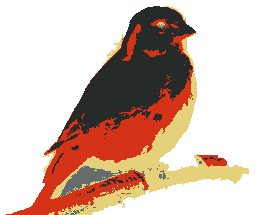

In [83]:
# testing pygwalker
GlobalVarManager.set_kanaries_api_key("ak-2d6df6409b9ac9bc28df7e041e94be0e091a35046e8f30e47b76404319ab61fd")
pyg.walk(top5_items_per_category, dark='light')

vis_spec = r"""{"config":[{"config":{"defaultAggregated":false,"geoms":["auto"],"coordSystem":"generic","limit":-1},"encodings":{"dimensions":[{"dragId":"gw_QDxj","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_hq3e","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_mea_key_fid","fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"dragId":"gw_i297","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_oL4Y","fid":"Calories From Fat","name":"Calories From Fat","basename":"Calories From Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Wb9C","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_vbmN","fid":"Saturated Fat","name":"Saturated Fat","basename":"Saturated Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_BuBm","fid":"Trans Fat","name":"Trans Fat","basename":"Trans Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_7JXL","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ApwP","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_mki_","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_VOTJ","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ROhJ","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_x29m","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_count_fid","fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"dragId":"gw_mea_val_fid","fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"dragId":"gw_54yI","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension","sort":"descending"}],"columns":[{"dragId":"gw_EPlH","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"color":[{"dragId":"gw_6MlR","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":true,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_nSV3","name":"Chart 1"}],"chart_map":{},"workflow_list":[{"workflow":[{"type":"view","query":[{"op":"raw","fields":["Item","Restaurant","Calories"]}]}]}],"version":"0.4.4"}"""
pyg.walk(top5_items_per_category, spec=vis_spec)

Box(children=(HTML(value='<div id="ifr-pyg-00061008a4fe37755LmiFS76PbIyAodY" style="height: auto">\n    <head>…


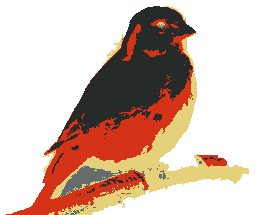

In [84]:
pyg.walk(bot5_items_per_category, dark='light')

vis_spec = r"""{"config":[{"config":{"defaultAggregated":true,"geoms":["auto"],"coordSystem":"generic","limit":-1},"encodings":{"dimensions":[{"dragId":"gw_bCz6","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_46T6","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_mea_key_fid","fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"dragId":"gw_GLLv","fid":"Sugar","name":"Sugar","basename":"Sugar","semanticType":"quantitative","analyticType":"measure"},{"dragId":"gw_UQDF","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","semanticType":"quantitative","analyticType":"measure"},{"dragId":"gw_DPn_","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_j7ch","fid":"Calories From Fat","name":"Calories From Fat","basename":"Calories From Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_WdAa","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_7hgX","fid":"Saturated Fat","name":"Saturated Fat","basename":"Saturated Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_NWwI","fid":"Trans Fat","name":"Trans Fat","basename":"Trans Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_PNC_","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_vMvw","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ydi1","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_No_8","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_count_fid","fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"dragId":"gw_mea_val_fid","fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"dragId":"gw_gyh4","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension","sort":"descending"}],"columns":[{"dragId":"gw_-dcz","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"color":[{"dragId":"gw_3BGh","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":false,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_jgQD","name":"Chart 1"}],"chart_map":{},"workflow_list":[{"workflow":[{"type":"view","query":[{"op":"aggregate","groupBy":["Item","Restaurant"],"measures":[{"field":"Calories","agg":"sum","asFieldKey":"Calories_sum"}]}]}]}],"version":"0.4.4"}"""
pyg.walk(bot5_items_per_category, spec=vis_spec, dark='light')


Box(children=(HTML(value='<div id="ifr-pyg-00061008db2f41c4YfNAHrDy873pZOCM" style="height: auto">\n    <head>…


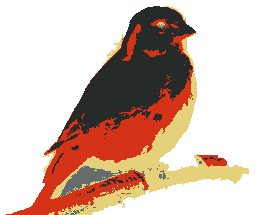

In [86]:
pyg.walk(menu_df, dark='light')

vis_spec = r"""{"config":[{"config":{"defaultAggregated":true,"geoms":["auto"],"coordSystem":"generic","limit":-1},"encodings":{"dimensions":[{"dragId":"gw_VVGG","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_OWXY","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_mea_key_fid","fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"dragId":"gw_75Q3","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_0W85","fid":"Calories From Fat","name":"Calories From Fat","basename":"Calories From Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_cp8X","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_zu6M","fid":"Saturated Fat","name":"Saturated Fat","basename":"Saturated Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_88WX","fid":"Trans Fat","name":"Trans Fat","basename":"Trans Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_m_Hu","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_J21g","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_YLjx","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_MYXs","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_-fhC","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_yV_p","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_count_fid","fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"dragId":"gw_mea_val_fid","fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"dragId":"gw_tJmT","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"median"},{"dragId":"gw_rTFW","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"median"},{"dragId":"gw_4gaZ","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"median"},{"dragId":"gw_SBoX","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"mean"},{"dragId":"gw_1TwG","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"median"},{"dragId":"gw_DTpz","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"median"},{"dragId":"gw_o4rJ","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"median"},{"dragId":"gw_b_42","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"median"}],"columns":[{"dragId":"gw_paBn","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"}],"color":[{"dragId":"gw_w6hX","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":false,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_3YE2","name":"Restaurant Comparison by Nutritional Value"},{"config":{"defaultAggregated":false,"geoms":["auto"],"coordSystem":"generic","limit":-1},"encodings":{"dimensions":[{"dragId":"gw_bBai","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_j2LJ","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_mea_key_fid","fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"dragId":"gw_ipSI","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_jDf4","fid":"Calories From Fat","name":"Calories From Fat","basename":"Calories From Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_z1tK","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_j0T5","fid":"Saturated Fat","name":"Saturated Fat","basename":"Saturated Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Oljm","fid":"Trans Fat","name":"Trans Fat","basename":"Trans Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ZbBZ","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_VEvD","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_T6cQ","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Jo1I","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_pgtn","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ELjp","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_count_fid","fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"dragId":"gw_mea_val_fid","fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"dragId":"gw_Uyos","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_8XLe","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Lj3W","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw__4GW","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_8DVn","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_scgV","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_vdDf","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"columns":[{"dragId":"gw_ost7","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"color":[{"dragId":"gw_iTlV","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":true,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_rQ6K","name":"Calorie Correlations"},{"config":{"defaultAggregated":false,"geoms":["auto"],"coordSystem":"generic","limit":-1},"encodings":{"dimensions":[{"dragId":"gw_bBai","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_j2LJ","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_mea_key_fid","fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"dragId":"gw_ipSI","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_jDf4","fid":"Calories From Fat","name":"Calories From Fat","basename":"Calories From Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_z1tK","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_j0T5","fid":"Saturated Fat","name":"Saturated Fat","basename":"Saturated Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Oljm","fid":"Trans Fat","name":"Trans Fat","basename":"Trans Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ZbBZ","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_VEvD","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_T6cQ","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Jo1I","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_pgtn","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ELjp","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_count_fid","fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"dragId":"gw_mea_val_fid","fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"dragId":"gw_ost7","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_8XLe","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Lj3W","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw__4GW","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_8DVn","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_scgV","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_vdDf","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"columns":[{"dragId":"gw_Uyos","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"color":[{"dragId":"gw_iTlV","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":true,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_MjqV","name":"Fat Correlations"},{"config":{"defaultAggregated":false,"geoms":["auto"],"coordSystem":"generic","limit":-1},"encodings":{"dimensions":[{"dragId":"gw_bBai","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_j2LJ","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_mea_key_fid","fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"dragId":"gw_ipSI","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_jDf4","fid":"Calories From Fat","name":"Calories From Fat","basename":"Calories From Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_z1tK","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_j0T5","fid":"Saturated Fat","name":"Saturated Fat","basename":"Saturated Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Oljm","fid":"Trans Fat","name":"Trans Fat","basename":"Trans Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ZbBZ","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_VEvD","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_T6cQ","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Jo1I","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_pgtn","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ELjp","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_count_fid","fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"dragId":"gw_mea_val_fid","fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"dragId":"gw_Uyos","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ost7","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_8XLe","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Lj3W","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw__4GW","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_8DVn","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_scgV","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"columns":[{"dragId":"gw_vdDf","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"color":[{"dragId":"gw_iTlV","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":true,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_wKV1","name":"Protein Correlations"},{"config":{"defaultAggregated":false,"geoms":["auto"],"coordSystem":"generic","limit":-1},"encodings":{"dimensions":[{"dragId":"gw_Lfqc","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_D0e2","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_mea_key_fid","fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"dragId":"gw_1xde","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_3jEt","fid":"Calories From Fat","name":"Calories From Fat","basename":"Calories From Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_yfON","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_9CdT","fid":"Saturated Fat","name":"Saturated Fat","basename":"Saturated Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_D4kg","fid":"Trans Fat","name":"Trans Fat","basename":"Trans Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_BfhL","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_HwTH","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_jECm","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_bW3F","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_-8R4","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_cjhY","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_count_fid","fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"dragId":"gw_mea_val_fid","fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[{"dragId":"gw_aWsJ","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_gheu","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"median"}],"columns":[{"dragId":"gw_Fzey","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_DLvz","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_dSjV","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_lvEV","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"color":[{"dragId":"gw_xqmB","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[{"dragId":"gw_Q2wN","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension","rule":{"type":"one of","value":["Mcdonalds","Subway"]}}],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":false,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_RNkc","name":"Chart 5"}],"chart_map":{},"workflow_list":[{"workflow":[{"type":"view","query":[{"op":"aggregate","groupBy":["Restaurant"],"measures":[{"field":"Calories","agg":"median","asFieldKey":"Calories_median"},{"field":"Total Carbohydrates","agg":"median","asFieldKey":"Total Carbohydrates_median"},{"field":"Total Fat","agg":"median","asFieldKey":"Total Fat_median"},{"field":"Fiber","agg":"mean","asFieldKey":"Fiber_mean"},{"field":"Sugar","agg":"median","asFieldKey":"Sugar_median"},{"field":"Sodium","agg":"median","asFieldKey":"Sodium_median"},{"field":"Cholesterol","agg":"median","asFieldKey":"Cholesterol_median"},{"field":"Protein","agg":"median","asFieldKey":"Protein_median"}]}]}]},{"workflow":[{"type":"view","query":[{"op":"raw","fields":["Restaurant","Calories","Total Fat","Fiber","Sugar","Sodium","Cholesterol","Total Carbohydrates","Protein"]}]}]},{"workflow":[{"type":"view","query":[{"op":"raw","fields":["Restaurant","Total Fat","Calories","Fiber","Sugar","Sodium","Cholesterol","Total Carbohydrates","Protein"]}]}]},{"workflow":[{"type":"view","query":[{"op":"raw","fields":["Restaurant","Protein","Total Fat","Calories","Fiber","Sugar","Sodium","Cholesterol","Total Carbohydrates"]}]}]},{"workflow":[{"type":"filter","filters":[{"fid":"Restaurant","rule":{"type":"one of","value":["Mcdonalds","Subway"]}}]},{"type":"view","query":[{"op":"raw","fields":["Restaurant","Restaurant","Total Fat","Sodium","Sugar","Cholesterol","Calories"]}]}]}],"version":"0.4.4"}"""
pyg.walk(menu_df, spec=vis_spec, dark='light')


In [94]:
pyg.walk(menu_df, dark='light')

vis_spec = r"""{"config":[{"config":{"defaultAggregated":true,"geoms":["auto"],"coordSystem":"generic","limit":-1},"encodings":{"dimensions":[{"dragId":"gw_P--m","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_LKwV","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_mea_key_fid","fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"dragId":"gw_F_fV","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_P3wh","fid":"Calories From Fat","name":"Calories From Fat","basename":"Calories From Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Sv1j","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_AHwe","fid":"Saturated Fat","name":"Saturated Fat","basename":"Saturated Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_FqRr","fid":"Trans Fat","name":"Trans Fat","basename":"Trans Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_BNWg","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_s1Dq","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ni6L","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_DIqT","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_VyRA","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Mu4u","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_count_fid","fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}},{"dragId":"gw_mea_val_fid","fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"rows":[],"columns":[],"color":[],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":false,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false}},"visId":"gw_sTQK","name":"Chart 1"},{"config":{"defaultAggregated":false,"geoms":["bar"],"coordSystem":"generic","limit":-1},"encodings":{"dimensions":[{"dragId":"gw_P--m","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_LKwV","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_mea_key_fid","fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"dragId":"gw_F_fV","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_P3wh","fid":"Calories From Fat","name":"Calories From Fat","basename":"Calories From Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Sv1j","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_AHwe","fid":"Saturated Fat","name":"Saturated Fat","basename":"Saturated Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_FqRr","fid":"Trans Fat","name":"Trans Fat","basename":"Trans Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_BNWg","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_s1Dq","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ni6L","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_DIqT","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_VyRA","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Mu4u","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_mea_val_fid","fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_count_fid","fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}}],"rows":[{"dragId":"gw_F_fV","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"columns":[{"dragId":"gw_LKwV","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension"}],"color":[],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"stack","interactiveScale":false,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false},"scaleIncludeUnmatchedChoropleth":false},"visId":"gw_ZSz-","name":"AskViz Chart"},{"config":{"defaultAggregated":false,"geoms":["point"],"coordSystem":"generic","limit":-1},"encodings":{"dimensions":[{"dragId":"gw_P--m","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_LKwV","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_mea_key_fid","fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"dragId":"gw_F_fV","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_P3wh","fid":"Calories From Fat","name":"Calories From Fat","basename":"Calories From Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Sv1j","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_AHwe","fid":"Saturated Fat","name":"Saturated Fat","basename":"Saturated Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_FqRr","fid":"Trans Fat","name":"Trans Fat","basename":"Trans Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_BNWg","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_s1Dq","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ni6L","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_DIqT","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_VyRA","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Mu4u","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_mea_val_fid","fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_count_fid","fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}}],"rows":[{"dragId":"gw_Mu4u","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"columns":[{"dragId":"gw_F_fV","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"color":[],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"none","interactiveScale":false,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false},"scaleIncludeUnmatchedChoropleth":false},"visId":"gw_OKZG","name":"AskViz Chart"},{"config":{"defaultAggregated":false,"geoms":["point"],"coordSystem":"generic","limit":-1},"encodings":{"dimensions":[{"dragId":"gw_P--m","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_LKwV","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_mea_key_fid","fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"dragId":"gw_F_fV","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_P3wh","fid":"Calories From Fat","name":"Calories From Fat","basename":"Calories From Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Sv1j","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_AHwe","fid":"Saturated Fat","name":"Saturated Fat","basename":"Saturated Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_FqRr","fid":"Trans Fat","name":"Trans Fat","basename":"Trans Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_BNWg","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_s1Dq","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ni6L","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_DIqT","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_VyRA","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Mu4u","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_mea_val_fid","fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_count_fid","fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}}],"rows":[{"dragId":"gw_Mu4u","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"columns":[{"dragId":"gw_F_fV","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"color":[],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"none","interactiveScale":false,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false},"scaleIncludeUnmatchedChoropleth":false},"visId":"gw_PRgI","name":"AskViz Chart"},{"config":{"defaultAggregated":false,"geoms":["point"],"coordSystem":"generic","limit":-1},"encodings":{"dimensions":[{"dragId":"gw_P--m","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_LKwV","fid":"Item","name":"Item","basename":"Item","semanticType":"nominal","analyticType":"dimension"},{"dragId":"gw_mea_key_fid","fid":"gw_mea_key_fid","name":"Measure names","analyticType":"dimension","semanticType":"nominal"}],"measures":[{"dragId":"gw_F_fV","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_P3wh","fid":"Calories From Fat","name":"Calories From Fat","basename":"Calories From Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Sv1j","fid":"Total Fat","name":"Total Fat","basename":"Total Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_AHwe","fid":"Saturated Fat","name":"Saturated Fat","basename":"Saturated Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_FqRr","fid":"Trans Fat","name":"Trans Fat","basename":"Trans Fat","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_BNWg","fid":"Cholesterol","name":"Cholesterol","basename":"Cholesterol","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_s1Dq","fid":"Sodium","name":"Sodium","basename":"Sodium","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_ni6L","fid":"Total Carbohydrates","name":"Total Carbohydrates","basename":"Total Carbohydrates","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_DIqT","fid":"Fiber","name":"Fiber","basename":"Fiber","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_VyRA","fid":"Sugar","name":"Sugar","basename":"Sugar","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_Mu4u","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_mea_val_fid","fid":"gw_mea_val_fid","name":"Measure values","analyticType":"measure","semanticType":"quantitative","aggName":"sum"},{"dragId":"gw_count_fid","fid":"gw_count_fid","name":"Row count","analyticType":"measure","semanticType":"quantitative","aggName":"sum","computed":true,"expression":{"op":"one","params":[],"as":"gw_count_fid"}}],"rows":[{"dragId":"gw_Mu4u","fid":"Protein","name":"Protein","basename":"Protein","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"columns":[{"dragId":"gw_F_fV","fid":"Calories","name":"Calories","basename":"Calories","analyticType":"measure","semanticType":"quantitative","aggName":"sum"}],"color":[{"dragId":"gw_P--m","fid":"Restaurant","name":"Restaurant","basename":"Restaurant","semanticType":"nominal","analyticType":"dimension"}],"opacity":[],"size":[],"shape":[],"radius":[],"theta":[],"longitude":[],"latitude":[],"geoId":[],"details":[],"filters":[],"text":[]},"layout":{"showActions":false,"showTableSummary":false,"stack":"none","interactiveScale":false,"zeroScale":true,"size":{"mode":"auto","width":320,"height":200},"format":{},"geoKey":"name","resolve":{"x":false,"y":false,"color":false,"opacity":false,"shape":false,"size":false},"scaleIncludeUnmatchedChoropleth":false},"visId":"gw_O8gn","name":"AskViz Chart"}],"chart_map":{},"workflow_list":[{"workflow":[{"type":"view","query":[{"op":"raw","fields":[]}]}]},{"workflow":[{"type":"view","query":[{"op":"raw","fields":["Item","Calories"]}]}]},{"workflow":[{"type":"view","query":[{"op":"raw","fields":["Calories","Protein"]}]}]},{"workflow":[{"type":"view","query":[{"op":"raw","fields":["Calories","Protein"]}]}]},{"workflow":[{"type":"view","query":[{"op":"raw","fields":["Restaurant","Calories","Protein"]}]}]}],"version":"0.4.4"}"""
pyg.walk(menu_df, spec=vis_spec, dark='light')


Box(children=(HTML(value='<div id="ifr-pyg-0006100960a18c02wxQ9SJhNqV6YtGOA" style="height: auto">\n    <head>…